In [33]:
import tensorflow as tf
import numpy as np
import glob
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from deeplab import DeepLabV3Plus
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
%matplotlib inline

In [3]:
img = glob.glob('./images/train/*/*.png')
label = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img]

index = np.random.permutation(len(img))
img = np.array(img)[index]
label = np.array(label)[index]

img_val = glob.glob('./images/val/*/*.png')
label_val = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_val]

train_count = len(label)
val_count = len(label_val)

dataset_train = tf.data.Dataset.from_tensor_slices((img, label))
dataset_val = tf.data.Dataset.from_tensor_slices((img_val, label_val))

2024-01-23 23:12:13.264918: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-23 23:12:13.269772: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-23 23:12:13.270046: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

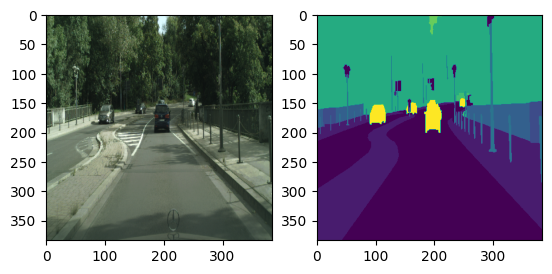

In [4]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

def read_png_label(path):
    with tf.device('/cpu:0'): 
        img = tf.io.read_file(path)
        img = tf.image.decode_png(img, channels=1)
        img = tf.where(img == 255, tf.zeros_like(img), img)
    return img

def crop_img(img, mask):

    # 确保img也是float32类型
    img_uint8 = tf.cast(img, tf.uint8)

    concat_img = tf.concat([img_uint8, mask], axis=-1)
    concat_img = tf.image.resize(concat_img, (400, 400), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    crop_img = tf.image.random_crop(concat_img, [384, 384, tf.shape(concat_img)[-1]])

    # 将裁剪后的图像和掩码分离，并将掩码转换回原始数据类型
    return crop_img[:, :, :3], tf.cast(crop_img[:, :, 3:], mask.dtype)



img_1 = read_png(img[0])
label_1 = read_png_label(label[0])
concat_img = tf.concat([img_1, label_1], axis=-1)
img_1, label_1 = crop_img(img_1, label_1)

plt.subplot(1,2,1)
plt.imshow(img_1.numpy())
plt.subplot(1,2,2)
plt.imshow(np.squeeze(label_1.numpy()))

In [5]:
def normal(img, mask):
    img = tf.cast(img, tf.float32)/127.5 -1
    mask = tf.cast(mask, tf.int32)
    return img, mask

def load_image_train(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)

    # 随机缩放
    scale = tf.random.uniform([], 0.7, 2)
    new_height = tf.cast(tf.cast(tf.shape(img)[0], tf.float32) * scale, tf.int32)
    new_width = tf.cast(tf.cast(tf.shape(img)[1], tf.float32) * scale, tf.int32)
    img = tf.image.resize(img, [new_height, new_width])
    mask = tf.image.resize(mask, [new_height, new_width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    img, mask = crop_img(img, mask)
    
    # 随机水平翻转
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)


    img, mask = normal(img, mask)

    return img, mask


def load_image_val(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img = tf.image.resize(img, (384, 384))
    mask = tf.image.resize(mask, (384, 384))
        
    img, mask = normal(img, mask)
    
    return img, mask

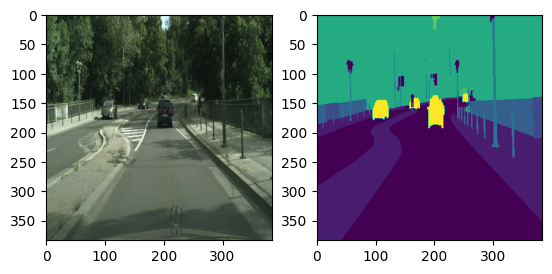

In [6]:
BCTCH_SIZE = 24
BUFFER_SIZE = 128
step_per_epoch = train_count//BCTCH_SIZE
val_step = val_count//BCTCH_SIZE

auto = tf.data.experimental.AUTOTUNE
dataset_train = dataset_train.map(load_image_train, num_parallel_calls=auto)
dataset_val = dataset_val.map(load_image_val, num_parallel_calls=auto)

for i, m in dataset_train.take(1):
    plt.subplot(1,2,1)
    plt.imshow((i.numpy() + 1)/2)
    plt.subplot(1,2,2)
    plt.imshow(np.squeeze(m.numpy()))

dataset_train = dataset_train.shuffle(BUFFER_SIZE).batch(BCTCH_SIZE)
dataset_val = dataset_val.batch(BCTCH_SIZE)

In [7]:
dataset_train

<_BatchDataset element_spec=(TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 1), dtype=tf.int32, name=None))>

In [8]:
# loss = tf.losses.SparseCategoricalCrossentropy(from_logits=True)

# # 创建 DeepLabV3Plus 模型
# model = DeepLabV3Plus(384, 384, 19)

# # 修改模型中特定层的参数
# for layer in model.layers:
#     if isinstance(layer, tf.keras.layers.BatchNormalization):
#         layer.momentum = 0.9997
#     elif isinstance(layer, tf.keras.layers.Conv2D):
#         layer.kernel_regularizer = tf.keras.regularizers.l2(1e-4)

# # 编译模型
# model.compile(loss=loss, 
#               optimizer=tf.optimizers.Adam(learning_rate=5e-4), 
#               metrics=['accuracy'])

# # model.summary()

In [9]:
tb = TensorBoard(log_dir='logs', write_graph=True, update_freq='batch')
mc = ModelCheckpoint(mode='min', filepath='top_weights.h5',
                     monitor='val_loss',
                     save_best_only='True',
                     save_weights_only='True', verbose=1)
callbacks = [mc, tb]

In [10]:
# model.fit(dataset_train,
#           # steps_per_epoch=step_per_epoch,
#           epochs=100,
#           validation_data=(dataset_val),
#           # validation_steps=val_step, 
#           )

In [11]:
model = DeepLabV3Plus(384, 384, 19)

*** Building DeepLabv3Plus Network ***
*** Output_Shape => (None, 384, 384, 19) ***


In [12]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().__call__(y_true, y_pred, sample_weight=sample_weight)
    
# optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
train_iou = MeanIoU(19, name='train_iou')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
test_iou = MeanIoU(19, name='test_iou')

In [13]:
base_learning_rate = 0.01
momentum = 0.9
weight_decay = 0.0005
power = 0.9
total_steps = 121520

# 使用内置的多项式衰减学习率调度
learning_rate_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=base_learning_rate,
    decay_steps=total_steps,
    end_learning_rate=0.0,  # 结束时的学习率
    power=power
)

class SGDW(tf.keras.optimizers.SGD):
    def __init__(self, weight_decay, *args, **kwargs):
        super(SGDW, self).__init__(*args, **kwargs)
        self.weight_decay = weight_decay

    def _resource_apply_dense(self, grad, var, apply_state=None):
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype)  # handle learning rate decay
        wd = lr_t * self.weight_decay

        var.assign_sub((lr_t * grad) + (wd * var))

optimizer = SGDW(
    weight_decay=weight_decay,
    learning_rate=learning_rate_schedule,
    momentum=momentum
)

In [14]:
def weight_decay_loss(model, weight_decay):
    # 计算所有可训练参数的L2损失
    l2_losses = [tf.nn.l2_loss(t) for t in model.trainable_variables if 'bias' not in t.name]
    # 将所有L2损失相加，并乘以权重衰减系数
    return weight_decay * tf.add_n(l2_losses)

@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = model(images, training=True)
        loss = loss_object(labels, predictions)
        # 添加权重衰减损失
        loss += weight_decay_loss(model, weight_decay)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    train_loss(loss)
    train_accuracy(labels, predictions)
    train_iou(labels, predictions)

@tf.function
def test_step(images, labels):
    predictions = model(images)
    t_loss = loss_object(labels, predictions)

    test_loss(t_loss)
    test_accuracy(labels, predictions)
    test_iou(labels, predictions)

EPOCHS = 100

for epoch in range(EPOCHS):
    train_loss.reset_states()
    train_accuracy.reset_states()
    train_iou.reset_states()
    test_loss.reset_states()
    test_accuracy.reset_states()
    test_iou.reset_states()

    for images, labels in dataset_train:
        train_step(images, labels)

    for test_images, test_labels in dataset_val:
        test_step(test_images, test_labels)

    template = 'Epoch {:3d}, Loss: {:.3f}, Accuracy: {:.3f}, \
                IOU: {:.3f}, Test Loss: {:.3f}, \
                Test Accuracy: {:.3f}, Test IOU: {:.3f}'
    print (template.format(epoch+1,
                           train_loss.result(),
                           train_accuracy.result()*100,
                           train_iou.result(),
                           test_loss.result(),
                           test_accuracy.result()*100,
                           test_iou.result() 
                           ))

2024-01-23 23:14:14.903818: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-01-23 23:14:37.952078: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7efa729f52b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-23 23:14:37.952146: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2024-01-23 23:14:38.021355: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-01-23 23:15:56.133808: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


Epoch   1, Loss: 20.858, Accuracy: 80.453,                 IOU: 0.250, Test Loss: 1.667,                 Test Accuracy: 54.469, Test IOU: 0.053
Epoch   2, Loss: 20.304, Accuracy: 86.888,                 IOU: 0.373, Test Loss: 1.695,                 Test Accuracy: 57.730, Test IOU: 0.054
Epoch   3, Loss: 19.984, Accuracy: 88.273,                 IOU: 0.434, Test Loss: 1.848,                 Test Accuracy: 55.702, Test IOU: 0.053
Epoch   4, Loss: 19.689, Accuracy: 89.132,                 IOU: 0.484, Test Loss: 1.348,                 Test Accuracy: 63.142, Test IOU: 0.094
Epoch   5, Loss: 19.410, Accuracy: 89.680,                 IOU: 0.513, Test Loss: 0.912,                 Test Accuracy: 72.196, Test IOU: 0.184
Epoch   6, Loss: 19.135, Accuracy: 90.221,                 IOU: 0.535, Test Loss: 0.683,                 Test Accuracy: 79.448, Test IOU: 0.273
Epoch   7, Loss: 18.869, Accuracy: 90.593,                 IOU: 0.553, Test Loss: 0.549,                 Test Accuracy: 83.370, Test IOU

In [15]:
model.save('my_model.h5') 

/environment/miniconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 52ms/step
Mean IoU:  0.48190057
Accuracy:  0.90648806
Precision:  0.95059025
Recall:  0.9792679


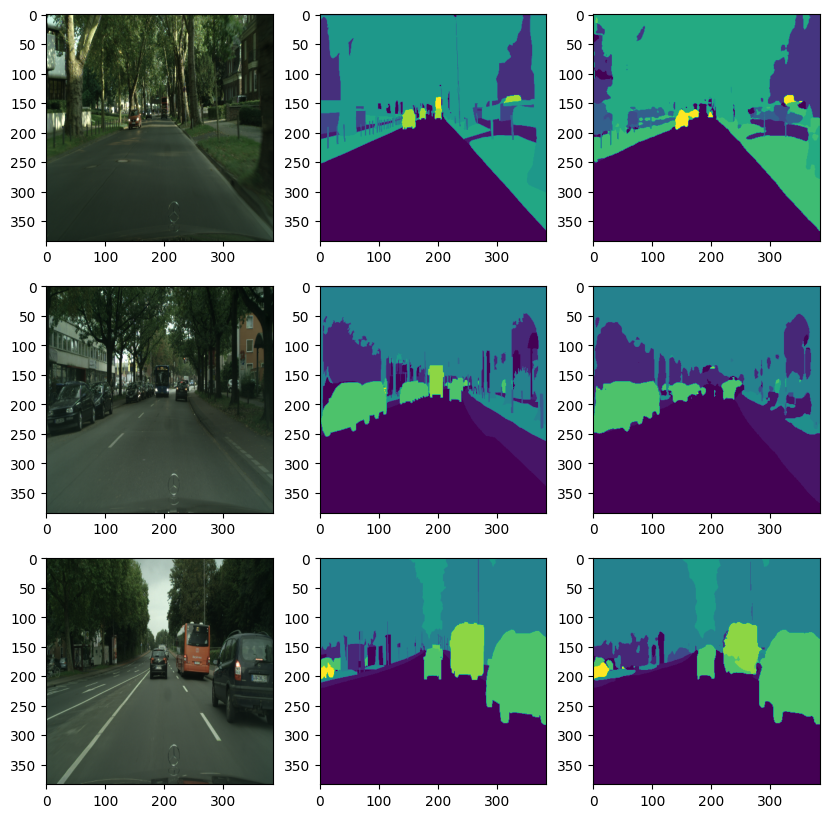

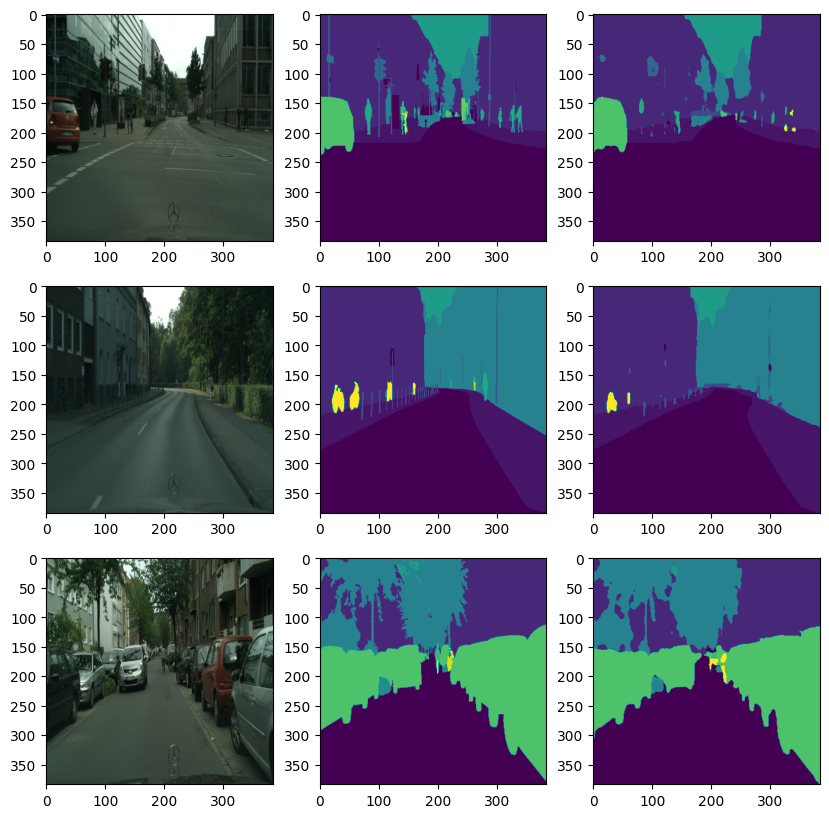

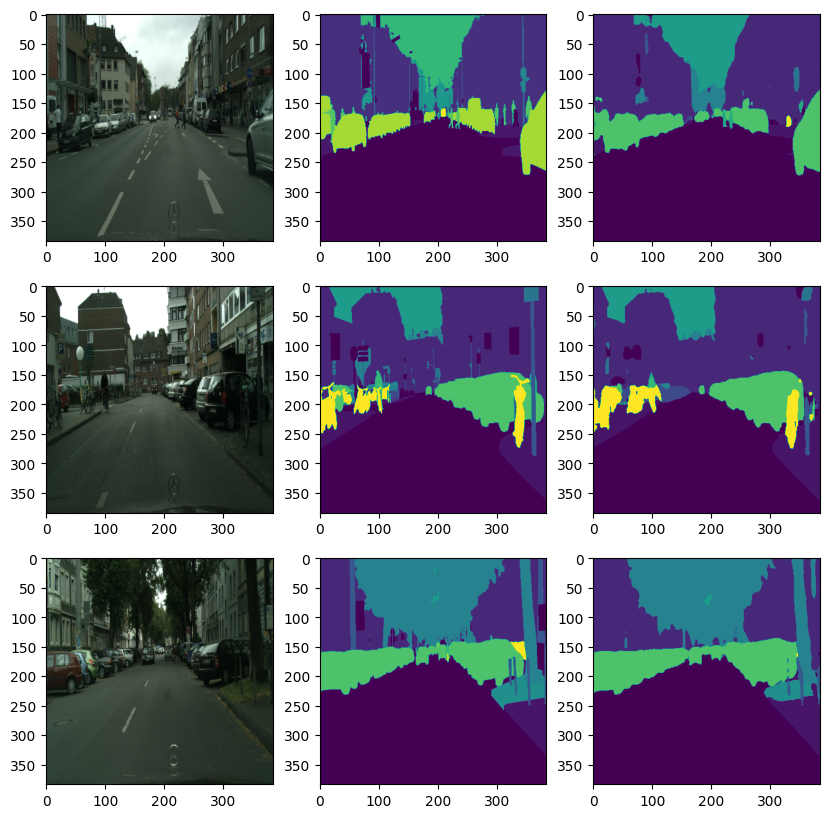

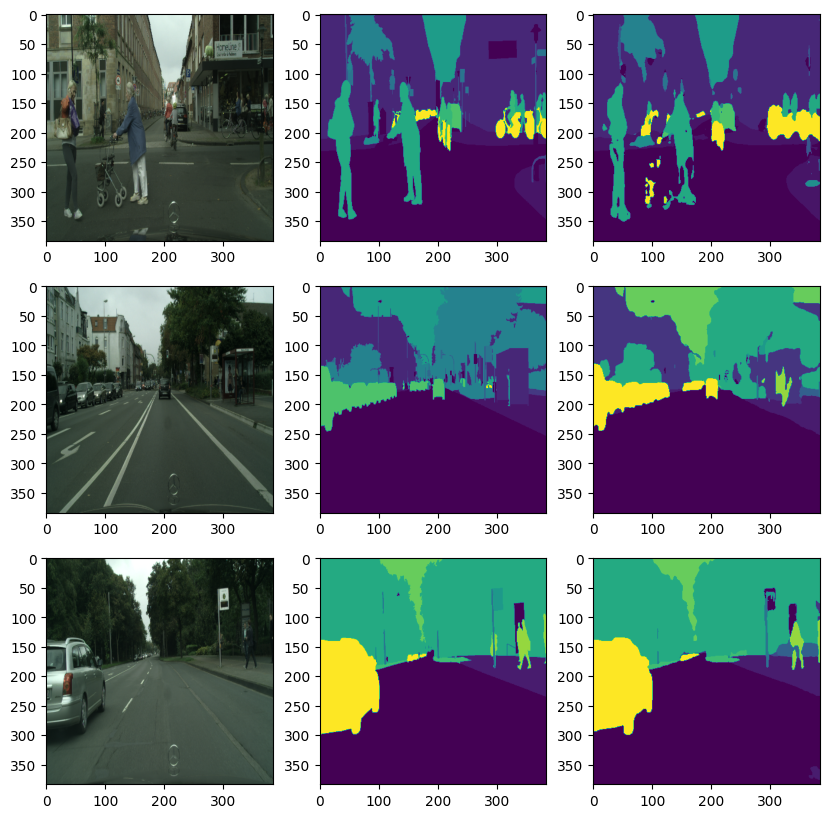

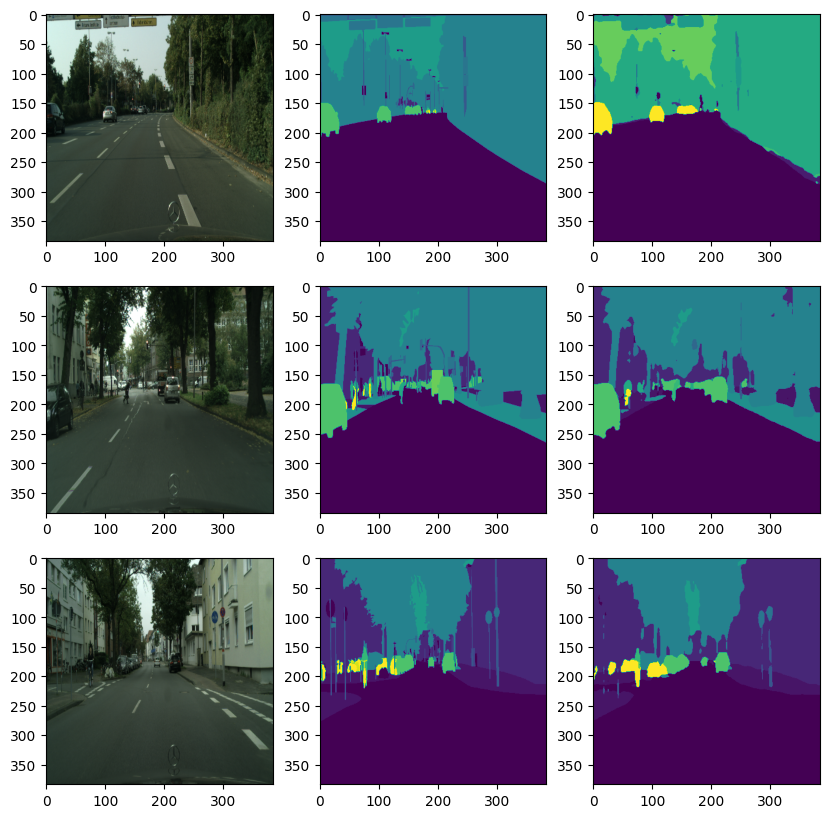

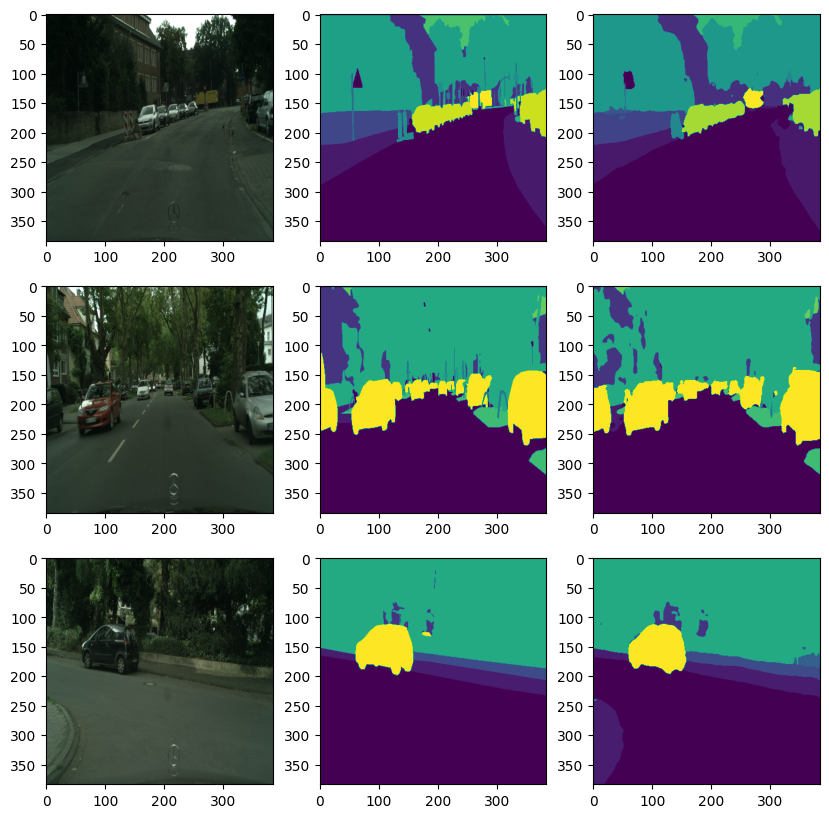

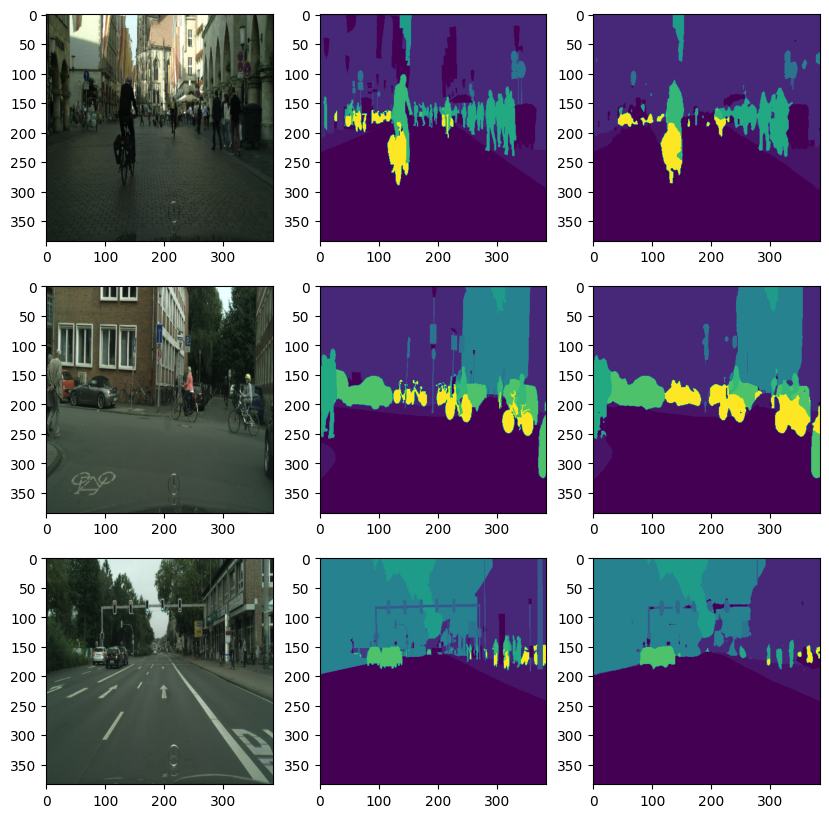

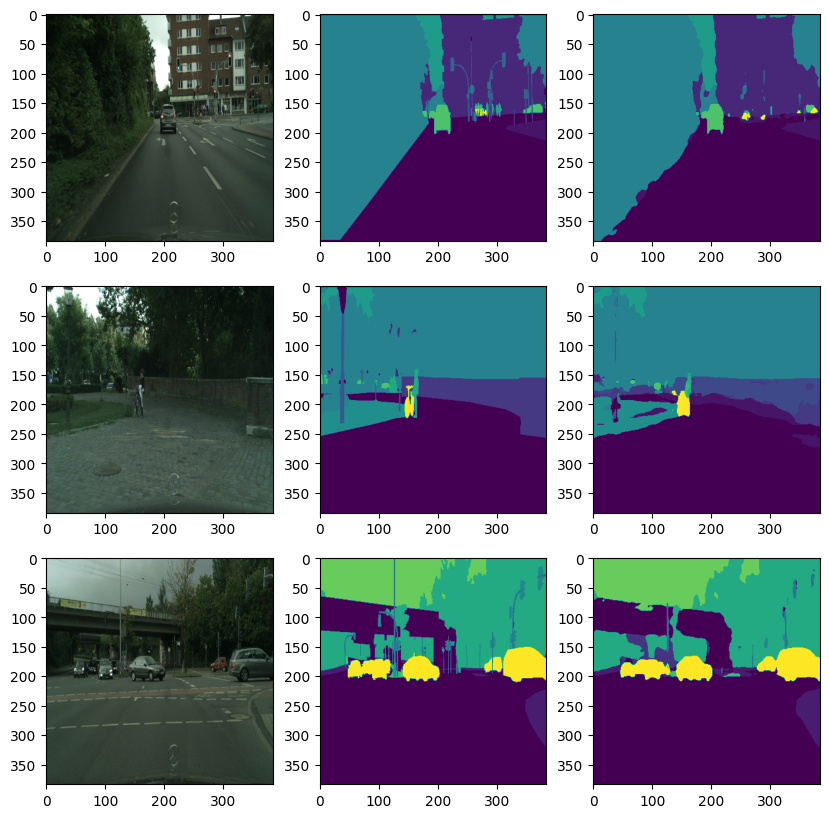

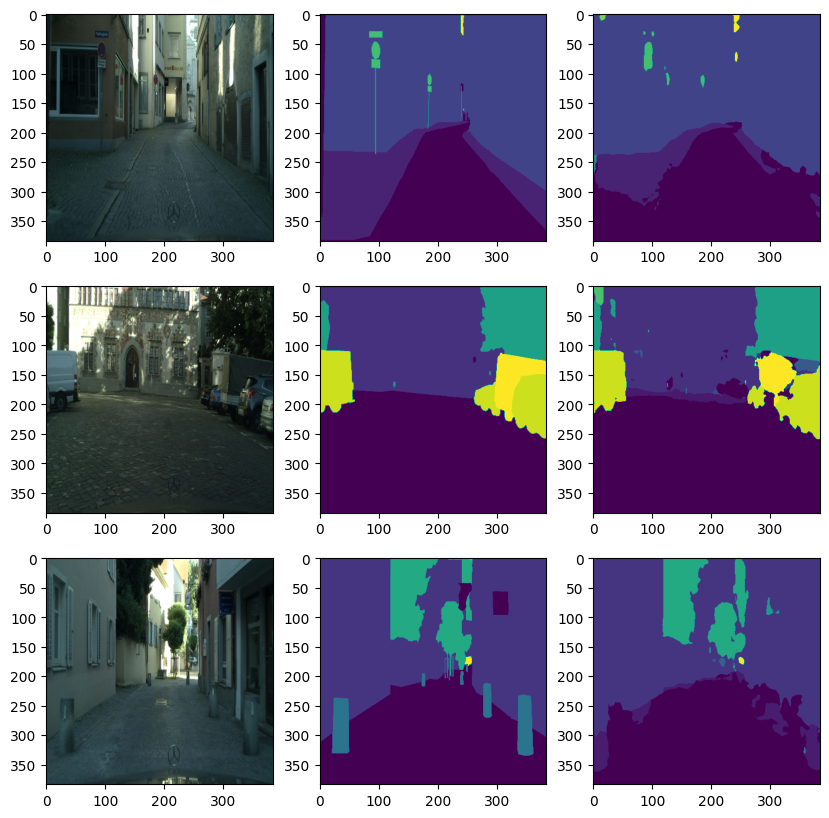

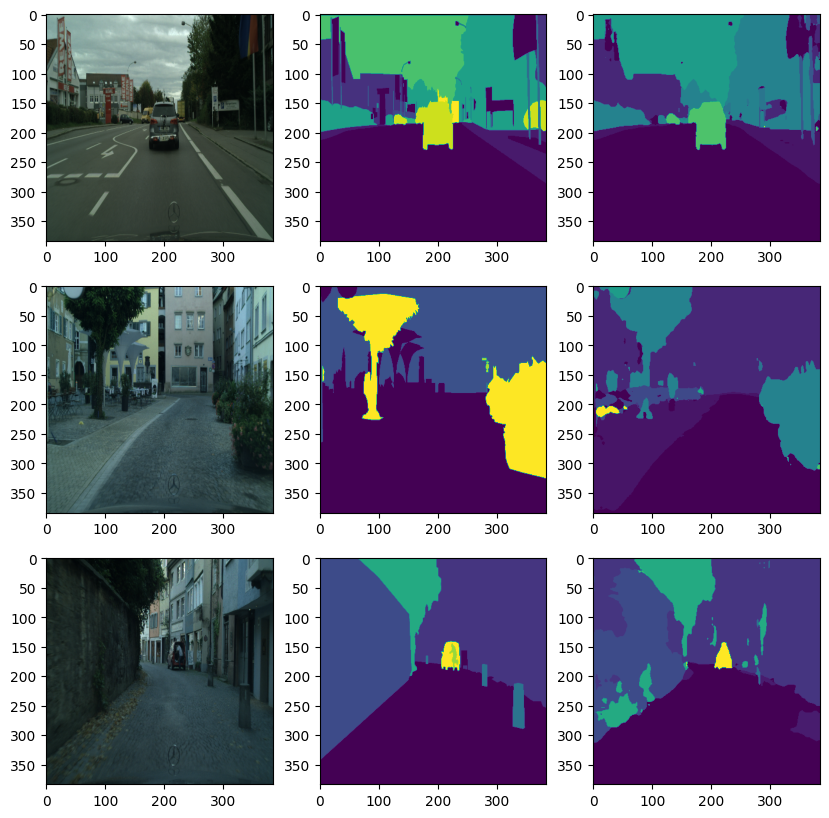

In [34]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=19)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

model.save_weights('path_to_my_weights.h5')
model.load_weights('path_to_my_weights.h5')

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

    plt.figure(figsize=(10, 10))
    for i in range(num):
        plt.subplot(num, 3, i*num+1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        plt.subplot(num, 3, i*num+2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        plt.subplot(num, 3, i*num+3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

/tmp/ipykernel_23010/1509818058.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('nipy_spectral', num_classes)


1/1 [==============================] - 0s 91ms/step


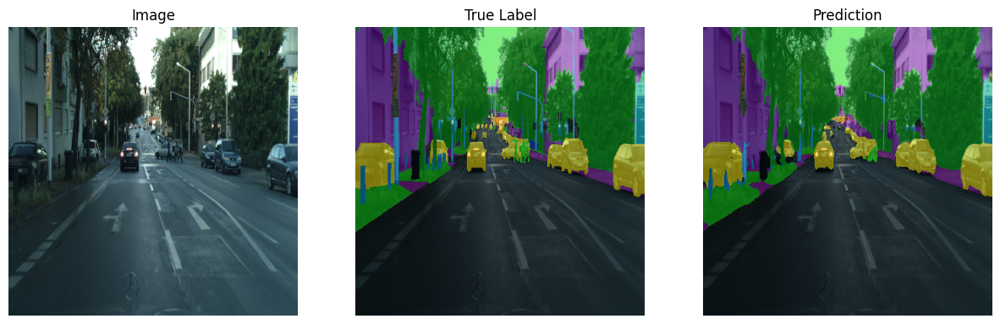

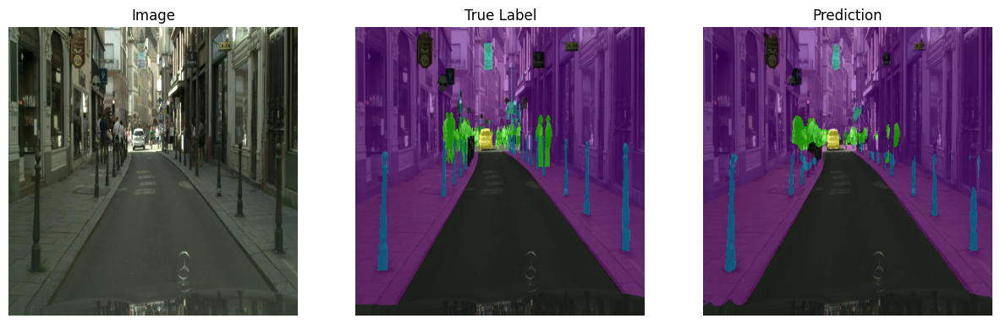

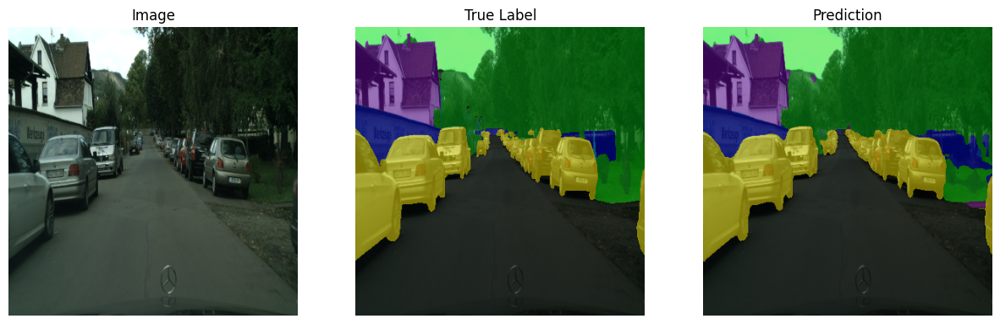

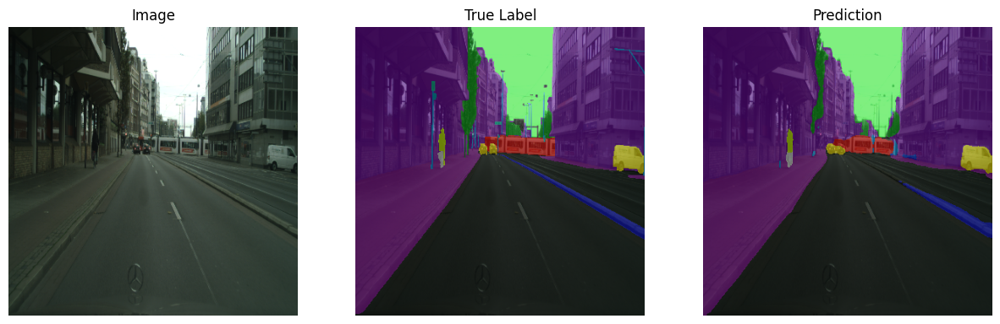

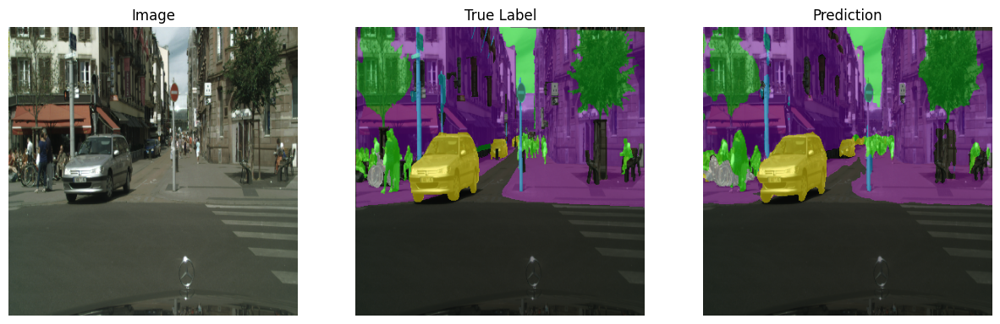

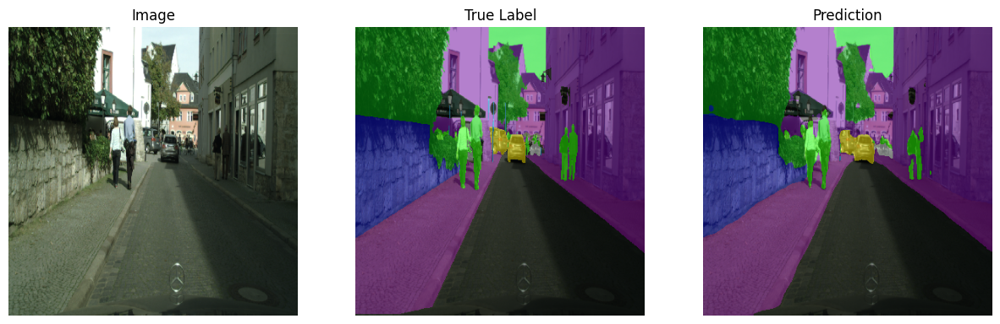

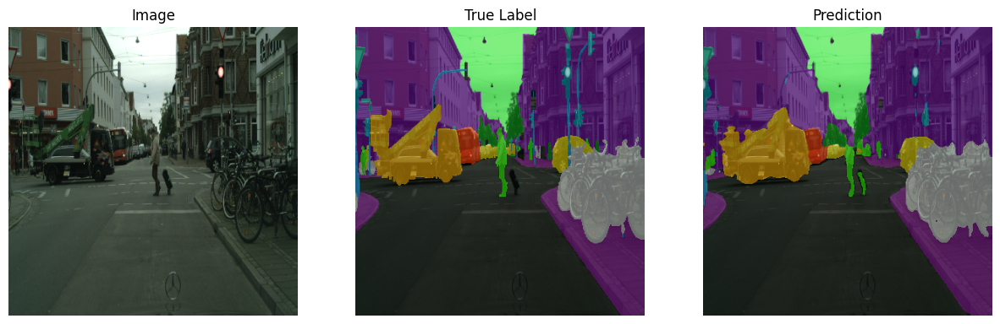

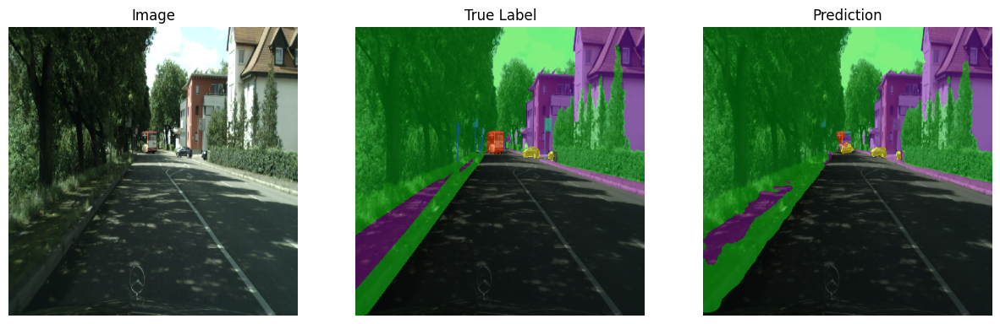

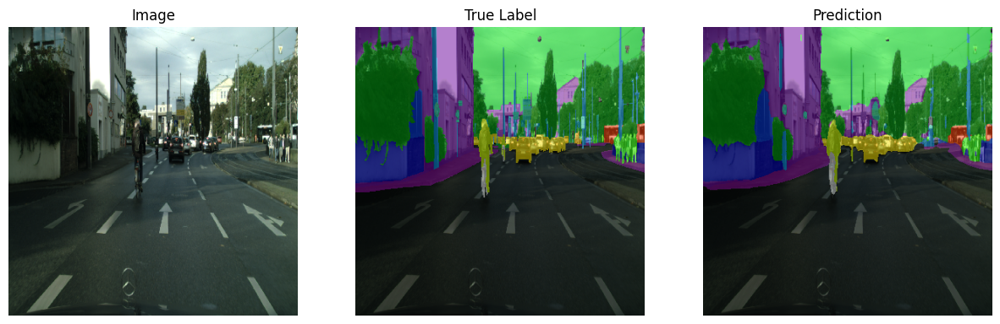

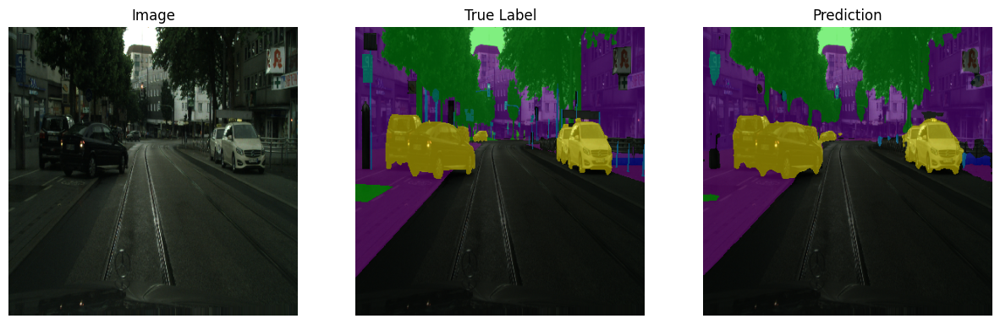

In [41]:
def plot_predictions(model, dataset, num_classes=19, num_samples=3):
    colors = plt.cm.get_cmap('nipy_spectral', num_classes)
    
    for images, labels in dataset.take(1):
        predictions = model.predict(images)
        predictions = tf.argmax(predictions, axis=-1)

        for i in range(num_samples):
            image = tf.keras.preprocessing.image.array_to_img(images[i])
            label = labels[i].numpy().squeeze()  # 假设标签是单通道的
            prediction = predictions[i].numpy()

            plt.figure(figsize=(15, 5))

            plt.subplot(1, 3, 1)
            plt.title("Image")
            plt.imshow(image)
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title("True Label")
            true_label_mask = colors(label)
            plt.imshow(image)
            plt.imshow(true_label_mask, cmap='nipy_spectral', vmin=0, vmax=num_classes-1, alpha=0.5)
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title("Prediction")
            prediction_mask = colors(prediction)
            plt.imshow(image)
            plt.imshow(prediction_mask, cmap='nipy_spectral', vmin=0, vmax=num_classes-1, alpha=0.5)
            plt.axis('off')

            plt.show()

plot_predictions(model, dataset_train, num_classes=19, num_samples=10)